# Wind Turbine Analysis using GRIDDB and Python

# Overview

The United States is dotted with several state of the art Wind Turbines designed and installed by leading turbine manufacturers and engineering teams. As per <a href = "https://www.eia.gov/energyexplained/wind/electricity-generation-from-wind.php#:~:text=Electricity%20generation%20with%20wind&text=Total%20annual%20U.S.%20electricity%20generation,U.S.%20utility%2Dscale%20electricity%20generation"> eia.gov </a>, wind turbines were the source of about 9.2% of the total power generation in the United States. With an interesting dataset in hand combined with a robust database product, we are going to analyze the wind turbines in the United States. 

## About the Dataset

The dataset in hand is a collection of land-
The United States Wind Turbine Database (USWTDB) provides the locations of land-based and offshore wind turbines in the United States, corresponding wind project information, and turbine technical specifications. The creation of this database was jointly funded by the U.S. Department of Energy (DOE) Wind Energy Technologies Office (WETO) via the Lawrence Berkeley National Laboratory (LBNL) Electricity Markets and Policy Group, the U.S. Geological Survey (USGS) Energy Resources Program, and the American Clean Power Association (ACP).

72,130 turbines covering 44 states (plus Guam and PR)

The data can be downloaded from https://eerscmap.usgs.gov/uswtdb/data/

For more information on how the data was collected, refer https://eta-publications.lbl.gov/sites/default/files/uswtdb_v5_1_20220729_memo.pdf

#### Dataset Citation:

Hoen, B.D., Diffendorfer, J.E., Rand, J.T., Kramer, L.A., Garrity, C.P., and Hunt, H.E., 2018, United States Wind Turbine Database v5.1 (July 29, 2022): U.S. Geological Survey, American Clean Power Association, and Lawrence Berkeley National Laboratory data release, https://doi.org/10.5066/F7TX3DN0.

## A short note on the Dataset variables

◘ case_id - unique uswtdb id	<br>
◘ faa_ors	- Digital obstacle file id <br>
◘ faa_asn	- Aeronautical Study number <br>
◘ usgs_pr_id	- USGS ID <br>
◘ t_state - State where the turbine is located <br>
◘ eia_id - Plant ID <br>
◘ t_county - County where the turbine is located <br>
◘ t_fips - State and county where turbine is located <br>
◘ p_name - Name of the turbine	<br>
◘ p_year - Year the project became operational <br> 
◘ p_tnum - Number of turbines in the project <br>
◘ p_cap  - Project Capacity (MegaWatt) <br>
◘ t_manu - Turbine OEM <br>
◘ t_model - Turbine Model <br>
◘ t_cap - Turbine Capacity (Kilowatt) <br>
◘ t_hh  - Turbine Hub Height (Meters) <br>
◘ t_rd  - Turbine Rotor Diameter (Meters) <br>
◘ t_rsa - Turbine Rotor Swept Area (Square Meters) <br>
◘ t_ttlh - Turbine Total Height (Meters) <br>
◘ retrofit - Whether the turbine has been retrofitted since initial construction or not. (0- No retrofit,1-Yes known retrofit)	
◘ retrofit_year - If the turbin was retrofitted, the year of retrofit. <br>
◘ t_conf_atr - Level of confidence in the attributes provided. This is an ordinal varible. <br>
◘ t_conf_loc - Location Confidence
◘ t_img_date - 
◘ t_img_srce	- source of image used to visually verify turbine location <br> 
◘ xlong	- Longitude (decimal degrees) 
◘ ylat    - Latitude (decimal degrees)

The code book can be downloaded <a href =https://emp.lbl.gov/publications/us-wind-turbine-database-files> here </a>.

## Overall Premise

The overall premise behind this blog post is to use the following interesting features of GRIDDB -

1. GRIDDB's TQL capability to retrieve aggregated data.
2. GRIDDB's SQL capability to retrieve data using sub-queries, case statements, group by clauses, having clauses as well retrieving multiple data points using nested sub-queries.

GRIDDB offers two types of containers namely 'Collections' and 'Time Series' containers. To learn more about different types of containers offered by GridDB, refer to this interesting article on <a href=https://griddb.net/en/blog/data-modeling-with-griddb>data modeling with GridDB</a>.

GRIDDB also offers multiple mechanisms to retrieve data from containers. It supports TQL as well as SQL to retrieve data. We will demonstrate different scenarios and how to retrieve data for the same from the GridDB container.   

Don't forget to get a <a href = https://griddb.net/en/blog/an-introduction-to-griddb-cloud/> GridDB cloud subscription </a> in order to get started.

### Loading the basic libraries required 

In [1]:
import os
import numpy as np
import pandas as pd
import nums_from_string as ns
from IPython.core.display import Image, display
import seaborn as sns
from matplotlib import pyplot as plt
from mapboxgl.utils import *
from mapboxgl.viz import *
from matplotlib.dates import DateFormatter
import plotly.graph_objects as go # For the map
sns.set()

C:\Users\mg_su\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


#### Points to note

1. It is important to remember that the order of the columns in the container should be the same as the order of the columns in the dataframe. This is similar to an Insert operation in any relational database.

In [2]:
Turbine_Data = pd.read_excel("Turbine_Data.xlsx", header=0,keep_default_na=True, index_col=None)

In [3]:
# Dropping rows that have the operational year (p_year) that are empty
print(len(Turbine_Data))
Turbine_Data.dropna(subset=['p_year'],inplace=True)
print(len(Turbine_Data))

72130
71398


###      Missing Value Imputations and Data type conversions

In [4]:
#Check for missing values and fill it
Turbine_Data.fillna(Turbine_Data.median(),inplace=True)
Turbine_Data.head()

C:\Users\mg_su\AppData\Local\Temp/ipykernel_13828/1904398437.py:2: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  Turbine_Data.fillna(Turbine_Data.median(),inplace=True)
C:\Users\mg_su\AppData\Local\Temp/ipykernel_13828/1904398437.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  Turbine_Data.fillna(Turbine_Data.median(),inplace=True)


,case_id,faa_ors,faa_asn,usgs_pr_id,eia_id,t_state,t_county,t_fips,p_name,p_year,...,t_rsa,t_ttlh,retrofit,retrofit_year,t_conf_atr,t_conf_loc,t_img_date,t_img_srce,xlong,ylat
0,3072661,NaN,NaN,5149.0,52161.0,CA,Kern County,6029,251 Wind,1987.0,...,7853.98,130.1,0,2019.0,2,3,2018-05-08,Digital Globe,-118.363762,35.077908
1,3072704,NaN,NaN,5146.0,52161.0,CA,Kern County,6029,251 Wind,1987.0,...,7853.98,130.1,0,2019.0,2,3,2018-05-08,Digital Globe,-118.364197,35.077644
2,3072695,NaN,NaN,5143.0,52161.0,CA,Kern County,6029,251 Wind,1987.0,...,7853.98,130.1,0,2019.0,2,3,2018-05-08,Digital Globe,-118.364410,35.077435
3,3063269,19-028130,2016-WTE-5934-OE,28597.5,57769.0,IA,Story County,19169,30 MW Iowa DG Portfolio,2017.0,...,12271.85,150.0,0,2019.0,3,3,2017-07-23,Digital Globe,-93.632835,41.882477
4,3063272,19-028134,2014-WTE-4084-OE,28597.5,57769.0,IA,Story County,19169,30 MW Iowa DG Portfolio,2017.0,...,12271.85,150.0,0,2019.0,3,3,2017-04-24,Digital Globe,-93.430367,42.028233


In [5]:
#Convert the datatypes of the data as needed
Turbine_Data['t_img_date'] = Turbine_Data['t_img_date'].astype(str)
Turbine_Data['usgs_pr_id'] = Turbine_Data['usgs_pr_id'].astype(str)
Turbine_Data['eia_id'] = Turbine_Data['eia_id'].astype(str)
Turbine_Data['t_cap'] = Turbine_Data['t_cap'].astype(str)
Turbine_Data.dtypes

case_id            int64
faa_ors           object
faa_asn           object
usgs_pr_id        object
eia_id            object
t_state           object
t_county          object
t_fips             int64
p_name            object
p_year           float64
p_tnum             int64
p_cap            float64
t_manu            object
t_model           object
t_cap             object
t_hh             float64
t_rd             float64
t_rsa            float64
t_ttlh           float64
retrofit           int64
retrofit_year    float64
t_conf_atr         int64
t_conf_loc         int64
t_img_date        object
t_img_srce        object
xlong            float64
ylat             float64
dtype: object

In [6]:
#Manipulate the data as needed
Turbine_Data['p_year'] = Turbine_Data['p_year'].astype(int).astype(str) # Convert from an integer to a string
Turbine_Data['p_year'] = Turbine_Data['p_year'] + '-01-01T00:00:00.000Z' # Append '-01-01' to it
col = Turbine_Data.pop("p_year") # Pop the column and store it in the variable 'col'
Turbine_Data.insert(0, col.name, col) #Re-insert the column as the first column of the dataframe
Turbine_Data.head()

,p_year,case_id,faa_ors,faa_asn,usgs_pr_id,eia_id,t_state,t_county,t_fips,p_name,...,t_rsa,t_ttlh,retrofit,retrofit_year,t_conf_atr,t_conf_loc,t_img_date,t_img_srce,xlong,ylat
0,1987-01-01T00:00:00.000Z,3072661,NaN,NaN,5149.0,52161.0,CA,Kern County,6029,251 Wind,...,7853.98,130.1,0,2019.0,2,3,2018-05-08,Digital Globe,-118.363762,35.077908
1,1987-01-01T00:00:00.000Z,3072704,NaN,NaN,5146.0,52161.0,CA,Kern County,6029,251 Wind,...,7853.98,130.1,0,2019.0,2,3,2018-05-08,Digital Globe,-118.364197,35.077644
2,1987-01-01T00:00:00.000Z,3072695,NaN,NaN,5143.0,52161.0,CA,Kern County,6029,251 Wind,...,7853.98,130.1,0,2019.0,2,3,2018-05-08,Digital Globe,-118.364410,35.077435
3,2017-01-01T00:00:00.000Z,3063269,19-028130,2016-WTE-5934-OE,28597.5,57769.0,IA,Story County,19169,30 MW Iowa DG Portfolio,...,12271.85,150.0,0,2019.0,3,3,2017-07-23,Digital Globe,-93.632835,41.882477
4,2017-01-01T00:00:00.000Z,3063272,19-028134,2014-WTE-4084-OE,28597.5,57769.0,IA,Story County,19169,30 MW Iowa DG Portfolio,...,12271.85,150.0,0,2019.0,3,3,2017-04-24,Digital Globe,-93.430367,42.028233


In [8]:
# Extracting column headers for the GridDB WebApi Container structure
col_vals = (list(Turbine_Data.columns.values))
col_dtypes = (list(Turbine_Data.dtypes))
data_tuples = list(zip(col_vals,col_dtypes)) # Binding lists to a tuple

# Converting list of tuples to pandas dataframe
container_columns = pd.DataFrame(data_tuples, columns=['col_vals','col_datatypes'])
container_columns.to_csv('container_columns.csv',index=False)
container_columns #column names for the container

,col_vals,col_datatypes
0,p_year,object
1,case_id,int64
2,faa_ors,object
3,faa_asn,object
4,usgs_pr_id,object
5,eia_id,object
6,t_state,object
7,t_county,object
8,t_fips,int64
9,p_name,object


The file 'container_columns' has all the headers and their datatypes. One last step is to change the Python datatypes to GridDB datatypes. Click <a href = https://docs.griddb.net/tqlreference/type/#primitive>here</a> to learn more about the datatypes supported by GRIDDB and their respective notations. 

### Setting up a Container in GridDB to store the data 

To learn more about creating a container in GRIDDB, refer to this <a href = https://docs.griddb.net/architecture/data-model/#container> resource</a> of GRIDDB.

In [7]:
import requests  # to make http calls
import http
http.client.HTTPConnection.debuglevel = 1 #Tip - to enable detailed logging of http calls; this is not needed in case you don't detailed logging

Note that while constructing the base_url, the container name is not required.

In [12]:
#Construct an object to hold the request headers (ensure that you replace the XXX placeholder with the correct value that matches the credentials for your GridDB instance)
header_obj = {"Authorization":"XXX","Content-Type":"application/json; charset=UTF-8","User-Agent":"PostmanRuntime/7.29.0"}

#Construct the base URL based on your GRIDDB cluster you'd like to connect to (ensure that you replace the placeholders in the URL below with the correct values that correspond to your GridDB instance)
#'https://[host]:[port]/griddb/v2/[clustername]/dbs/[database_name]'
base_url = 'https://[host]/griddb/v2/[clustername]/dbs/[databasename]'

In [ ]:
#Construct an object to hold the request body (i.e., the container that needs to be created)
data_obj = {
    "container_name": "Wind_Turbine_Data",
    "container_type": "COLLECTION",
    "rowkey": False,
    "columns": [
    {
    "name": "p_year",
    "type": "TIMESTAMP"
    },
    {
    "name": "case_id",
    "type": "INTEGER"
    },
    {
    "name": "faa_ors",
    "type": "STRING"
    },
    {
    "name": "faa_asn",
    "type": "STRING"
    },
    {
    "name": "usgs_pr_id",
    "type": "STRING"
    },
    {
    "name": "eia_id",
    "type": "STRING"
    },
    {
    "name": "t_state",
    "type": "STRING"
    },        
    {
    "name": "t_county",
    "type": "STRING"
    },
    {
    "name": "t_fips",
    "type": "INTEGER"
    },
    {
    "name": "p_name",
    "type": "STRING"
    },
    {
    "name": "p_tnum",
    "type": "INTEGER"
    },
    {
    "name": "p_cap",
    "type": "FLOAT"
    },
    {
    "name": "t_manu",
    "type": "STRING"
    },
    {
    "name": "t_model",
    "type": "STRING"
    },
    {
    "name": "t_cap",
    "type": "STRING"
    },
    {
    "name": "t_hh",
    "type": "STRING"
    },
    {
    "name": "t_rd",
    "type": "STRING"
    },
    {
    "name": "t_rsa",
    "type": "STRING"
    },
    {
    "name": "t_ttlh",
    "type": "STRING"
    },
    {
    "name": "retrofit",
    "type": "INTEGER"
    },
    {
    "name": "retrofit_year",
    "type": "STRING"
    },
    {
    "name": "t_conf_atr",
    "type": "INTEGER"
    },
    {
    "name": "t_conf_loc",
    "type": "INTEGER"
    },
    {
    "name": "t_img_date",
    "type": "STRING"
    },
    {
    "name": "t_img_srce",
    "type": "STRING"
    },
    {
    "name": "xlong",
    "type": "FLOAT"
    },
    {
    "name": "ylat",
    "type": "FLOAT"
    }
    ]
}

#Set up the GridDB WebAPI URL
url = base_url + '/containers'

#Invoke the GridDB WebAPI with the headers and the request body
x = requests.post(url, json = data_obj, headers = header_obj)

## Loading Data into the GridDB container (Row Registration)

The 'to_json' function of Pandas is used to build the request body that will be used for loading data to the container.
To learn more on the format required to add rows to the container, refer to <a href = http://www.toshiba-sol.co.jp/en/pro/griddb/docs-en/v4_3/GridDB_Web_API_Reference.html#%E3%83%AD%E3%82%A6%E7%99%BB%E9%8C%B2>this article</a>. 

In [13]:
#Convert the data in the dataframe to the JSON format
Turbine_Data_json = Turbine_Data.to_json(orient='values')
request_body = Turbine_Data_json

The url is constructed with the base url and the newly created container name. (In this case, 'Wind_Turbine_Data')

In [ ]:
#Setup the URL to be used to invoke the GridDB WebAPI to register rows in the container created previously
url = 'https://[server]/griddb/v2/[clusterName]/dbs/[databasename]/containers/Wind_Turbine_Data/rows'

#Invoke the GridDB WebAPI using the request constructed
x = requests.put(url, data=request_body, headers=header_obj)

## How many turbines became operational after 2000?

In [15]:
#Construct the SQL to be used
sql = ("SELECT p_year, count(*) as cnt FROM Wind_Turbine_Data where p_year >=TIMESTAMP('2000-01-01T00:00:00.000Z') group by p_year")

In [ ]:
#Setup the URL to be used to invoke the GridDB WebAPI to retrieve data from the container
url = base_url + '/sql'

In [17]:
#Construct the request body
request_body = '[{"type":"sql-select", "stmt":"'+sql+'"}]'

In [18]:
#Validate the constructed request body
request_body

'[{"type":"sql-select", "stmt":"SELECT p_year, count(*) as cnt FROM Wind_Turbine_Data where p_year >=TIMESTAMP(\'2000-01-01T00:00:00.000Z\') group by p_year"}]'

Invoke the GridDB SQL API to retrieve the results and process it. 

In [ ]:
#Invoke the GridDB WebAPI
data_req1 = requests.post(url, data=request_body, headers=header_obj)

In [20]:
#Process the response received and construct a Pandas dataframe with the data from the response
myJson = data_req1.json()
Turbines_after_2000 = pd.DataFrame(myJson[0]["results"], columns=[myJson[0]["columns"][0]["name"], myJson[0]["columns"][1]["name"]])
Turbines_after_2000=Turbines_after_2000.sort_values(by=['cnt'], ascending=False)

C:\Users\mg_su\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


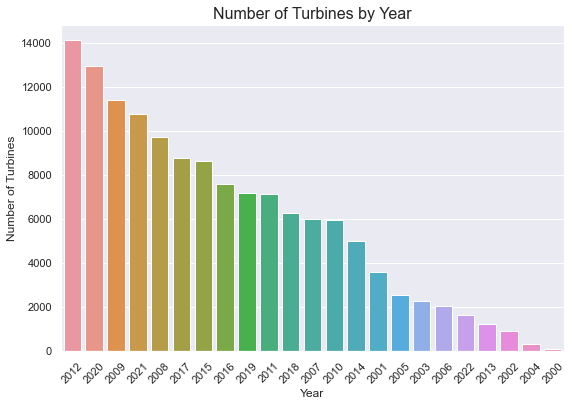

In [21]:
#Plot the data as a bar plot
Turbines_after_2000['year_formatted'] = pd.to_datetime(Turbines_after_2000['p_year'])
Turbines_after_2000['year'] = pd.DatetimeIndex(Turbines_after_2000['year_formatted']).year
fig,ax = plt.subplots(figsize=(9,6))
sns.barplot(Turbines_after_2000['year'], Turbines_after_2000['cnt'], ax=ax,order=Turbines_after_2000.sort_values('cnt',ascending = False).year)
ax.set_title('Number of Turbines by Year', fontsize = 16, loc='center')
ax.set_xlabel('Year', fontsize = 12)
ax.set_ylabel('Number of Turbines', fontsize = 12)
plt.xticks(rotation=45)
plt.show()

### Insight(s):

<b> <br> ◘ 2012 was the year that the most number of turbine projects were made operational with 7000+ turbines being made operational. <br> ◘ Around 2020, 6000+ turbines were made operational. <br> ◘ 2000 was the year that the least number of turbine projects went operational.

## What is the average number of turbines in each project?

To retrieve this data, we will use GridDB's tql functionality to run the aggregation to retrieve the average number of turbines. <br/><br/>
Invoke the GridDB TQL API to retrieve and process the results. 

In [ ]:
#Setup the URL to be used to invoke the GridDB WebAPI to retrieve data from the container
url = base_url + '/tql'

#Construct the request body which has the TQL that is to be used to retrieve the data
# Getting data for series_id APU0000709111 - Milk, fresh, whole, fortified; APU0000709211 - Milk, fresh, skim; APU0000709212 - Milk, fresh, low fat; APU0200709111 - Milk, fresh, whole, fortified; APU0200709211 - Milk, fresh, skim
request_body = '[{"name":"Wind_Turbine_Data", "stmt":"SELECT AVG(p_tnum) ", "columns":[]}]' 

#Invoke the GridDB WebAPI
data_req2 = requests.post(url, data=request_body, headers=header_obj)
data_req2

In [23]:
#Process the response received and construct a Pandas dataframe with the data from the response
myJson = data_req2.json()
Avg_Num_Turbines = pd.DataFrame(myJson[0]["results"], columns=[myJson[0]["columns"][0]["name"]])

In [24]:
print('The average number of turbines created per project is', Avg_Num_Turbines['aggregationResult'][0])

The average number of turbines created per project is 105.33435984616243


## Which are the turbine manufacturers who have constructed more than 200 turbines ?  

Note that alias names in GRIDDB do not need to be encapsulated in quotes unlike some relational databases. <br/><br/>

Construct a SQL query which will aggregate the number of turbines. The query will group the data based on the manufacturer and will have a having clause to restrict the results to manufacturers who have more than 200 turbines. 

In [25]:
#Construct the SQL to be used
sql = ("SELECT t_manu,SUM(p_tnum) as Total_Turbines FROM Wind_Turbine_Data where t_manu is NOT NULL GROUP BY t_manu HAVING SUM(p_tnum) >=200")

Invoke the GridDB API and retrieve and process the results. 

In [ ]:
#Setup the URL to be used to invoke the GridDB WebAPI to retrieve data from the container
url = base_url + '/sql'

#Construct the request body which has the SQL that is to be used to retrieve the data
request_body = '[{"type":"sql-select", "stmt":"'+sql+'"}]'

#Invoke the GridDB WebAPI
data_req4 = requests.post(url, data=request_body, headers=header_obj)
data_req4

In [27]:
#Process the response received and construct a Pandas dataframe with the data from the response
myJson = data_req4.json()
manufacturers_and_models = pd.DataFrame(myJson[0]["results"], columns=[myJson[0]["columns"][0]["name"],myJson[0]["columns"][1]["name"]])

Let's display the results in a tabular form. 

In [43]:
from tabulate import tabulate
print(tabulate(manufacturers_and_models, headers='keys', tablefmt='psql'))

+----+---------------------------------+------------------+
|    | t_manu                          |   Total_Turbines |
|----+---------------------------------+------------------|
|  0 | Enron                           |           105018 |
|  1 | Fuhrlander                      |              232 |
|  2 | DWT                             |              294 |
|  3 | NEG Micon                       |            42574 |
|  4 | Sany                            |              326 |
|  5 | Suzlon                          |           114410 |
|  6 | Acciona                         |           112956 |
|  7 | Alstom                          |              576 |
|  8 | China Creative Wind Energy      |              578 |
|  9 | Micon                           |            89688 |
| 10 | Nordex                          |           225556 |
| 11 | Nordtank                        |            52680 |
| 12 | Bonus                           |            90196 |
| 13 | NedWind                         |

## What does the geographical distribution of wind turbines look like?

Tip: GRIDDB does not require an 'as' keyword while providing the alias name. Similarly, like some relational database platforms, it requires an alias names for subqueries. <br/><br/>
We will construct a SQL query which will use a sub-query and will also use a sql case statement to categorize the data into different bins or groups. The bins would be usedin the visualization later on. 

In [29]:
#Construct the sub-query SQL to be used
sql = ("SELECT t_manu,p_name,Turbine_Num, xlong,ylat, CASE WHEN Turbine_Num = 1 THEN '1 turbine' WHEN Turbine_Num >= 2 AND Turbine_Num <= 25 THEN '2-25 turbines' WHEN Turbine_Num >= 26 AND Turbine_Num <= 100 THEN '26-100 turbines' WHEN Turbine_Num >= 101 AND Turbine_Num <= 500 THEN '101-500 turbines' WHEN Turbine_Num >= 501 AND Turbine_Num <= 750 THEN '501-750 turbines' END Turbine_bins FROM (SELECT DISTINCT t_manu,p_name,xlong,ylat, Sum(p_tnum) Turbine_Num FROM Wind_Turbine_Data where t_manu is NOT NULL GROUP BY t_manu,p_name,xlong,ylat) t")

We will now run the SQL against the GridDB container and fetch the results and process it. 

In [ ]:
#Setup the URL to be used to invoke the GridDB WebAPI to retrieve data from the container
url = base_url + '/sql'

#Construct the request body which has the SQL that is to be used to retrieve the data
request_body = '[{"type":"sql-select", "stmt":"'+sql+'"}]'

#Invoke the GridDB WebAPI
data_req5 = requests.post(url, data=request_body, headers=header_obj)


In [31]:
#Process the response received and construct a Pandas dataframe with the data from the response
myJson = data_req5.json()
Turbine_Locations = pd.DataFrame(myJson[0]["results"], columns=[myJson[0]["columns"][0]["name"],myJson[0]["columns"][1]["name"],myJson[0]["columns"][2]["name"],myJson[0]["columns"][3]["name"],myJson[0]["columns"][4]["name"],myJson[0]["columns"][5]["name"]])

In [32]:
#Let's take a look at some of the data
Turbine_Locations.tail()

,t_manu,p_name,Turbine_Num,xlong,ylat,Turbine_bins
67040,GE Wind,Chisholm View,280,-97.63049,36.569794,101-500 turbines
67041,Siemens,Highland I,422,-95.59623,42.994860,101-500 turbines
67042,GE Wind,Gratiot,128,-84.48589,43.429493,101-500 turbines
67043,Vestas,Mountain View Power Partners III,68,-116.59159,33.920395,26-100 turbines
67044,Vestas,Timber Road IV,62,-84.68003,41.130756,26-100 turbines


In [33]:
#Create a list which will have the bin names
cut_labels = ['1 turbine','2-25 turbines', '26-100 turbines', '101-500 turbines', '501-750 turbines']

The data has been retrieved, categorized into bins and is available in a dataframe. <br/>
For each bin or categorization, we will filter the dataframe to get the records corresponding to the bin and plot the same on a map of the United States. Each bin will use a different color. <br/>

In [42]:
#Plot the data
scale = 55

fig = go.Figure()
limits = [(0,1),(2,25),(26,100),(101,500),(501,750)]
colors = ["maroon","cyan","lime","mediumorchid","royalblue"]

#plot the data for each bin
for i in range(len(limits)):
    
    lim = limits[i]

    #filter the dataframe to get the records for the current bin
    Turbine_Data_filtered = Turbine_Locations.loc[(Turbine_Locations['Turbine_bins'] == cut_labels[i])]

    #plot the data
    fig.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = Turbine_Data_filtered['xlong'],
        lat = Turbine_Data_filtered['ylat'],
        text = Turbine_Data_filtered['p_name'],
        marker = dict(
            size = Turbine_Data_filtered['Turbine_Num']/scale,  #size of the marker will depend on the number of turbines
            color = colors[i],
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(lim[0],lim[1])
        )
    )

    
fig.update_layout(
        title_text = 'Turbine Distribution in the United States',
        showlegend = True,
        geo = dict(
            scope = 'usa',
            landcolor = 'rgb(217, 217, 217)',
        )

    )

fig.update_layout(
    title={
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()

<b> Note: </b> The map is interactive and details of each dot can be accessed using the tooltips upon hovering over them. Use the lasso and zoom functions to know more.

### Insight(s):

◘  The country is dotted with several turbine projects having between 26 and 500 turbines. <br>
◘  A few spots in Central US have between 501 and 750 turbines each.<br>
◘  Arkansas has several projects having between 2 and 25 turbines. <br>
◘  The Delta junction facility in Alaska has just 1 turbine. <br>
◘  Hawaii has several facilities (almost 8) having between 2 and 25 turbines each. <br>
◘  Kawailoa Wind Facility in Hawaii has around 26 and 100 turbines.<br>

##  Answering 3 questions at once with GridDB's query engine

Below is a subquery of the format SELECT (SELECT query1), (SELECT query2), (SELECT query3). Each sub-query answers one of the questions below -

#### - How many plants had one or more turbines retrofitted? 
#### - How many turbines have been retrofitted since installation?
#### - How many turbines have not been retrofitted at all?

Construct a single SQL query which will retrieve the 3 pieces of data required to answer the 3 questions above. THis query will be executed just once against GridDB and there is no need to run 3 separate queries to retrieve the data needed.

In [35]:
sql = ("SELECT (SELECT COUNT(DISTINCT eia_id) FROM Wind_Turbine_Data WHERE retrofit = 1) plant_count,(SELECT SUM(p_tnum) as Turbine_Num FROM Wind_Turbine_Data WHERE retrofit =1) retrofitted_turbines,(SELECT SUM(p_tnum) as Turbine_Num FROM Wind_Turbine_Data WHERE retrofit =0) Turbines_not_retrofitted")

Invoke the GridDB API with the constructed SQL query and retrieve the results.

In [ ]:
#Setup the URL to be used to invoke the GridDB WebAPI to retrieve data from the container
url = base_url + '/sql'

#Construct the request body which has the SQL that is to be used to retrieve the data
request_body = '[{"type":"sql-select", "stmt":"'+sql+'"}]'

#Invoke the GridDB WebAPI
data_req6 = requests.post(url, data=request_body, headers=header_obj)
data_req6

<b> As you can see above, the results of all 3 queries are appended to the results json as a list. We can just fetch these to analyze our results. This approach is not only optimal in terms of performance but also reduces the number of calls made to the GRIDDB API. </b>

In [37]:
#Process the response received and construct a Pandas dataframe with the data from the response
myJson = data_req6.json()
Resulting_Data = pd.DataFrame(myJson[0]["results"], columns=[myJson[0]["columns"][0]["name"],myJson[0]["columns"][1]["name"],myJson[0]["columns"][2]["name"]])

In [38]:
#This is how the results are written to the dataframe.
Resulting_Data

,plant_count,retrofitted_turbines,Turbines_not_retrofitted
0,86,1288046,13830384


Let's now create KPI tiles with these data points. 

In [40]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Indicator(
    mode = "number",
    value = Resulting_Data['plant_count'][0],
    title = {"text": "Plants with retrofitted turbines<br><span style='font-size:0.8em;color:gray'></span>"},
    domain = {'x': [0, 0.5], 'y': [0.5,1]},
))

fig.add_trace(go.Indicator(
    mode = "number",
    value = Resulting_Data['retrofitted_turbines'][0],
    title = {"text": "Turbines retrofitted since installation<br><span style='font-size:0.8em;color:gray'></span>"},
    domain = {'x': [0.5, 1], 'y': [0.5, 1]}))

fig.add_trace(go.Indicator(
    mode = "number",
    value = Resulting_Data['Turbines_not_retrofitted'][0],
    title = {"text": "Turbines not retrofitted since installation<br><span style='font-size:0.8em;color:gray'></span>"},
    domain = {'x': [0, 1], 'y': [0,0.5]}))


fig.update_layout(paper_bgcolor = "lightgray", )


fig.show()

## Concluding Remarks 

As you can see, GridDB's query engine can effectively process most types of subqueries. Though this article talks about turbine data, it is a good example to demonstrate how GridDB can be harnessed for its performance; and its capabilities in resolving subqueries. There are many more variables in the dataset that can be analyzed using Python and GRIDDB. Besides this, GRIDDB and Python can be exploited effectively to great business reports that drive valuable KPIs and metrics and can be used across domains ranging from Manufacturing and Healthcare to Entertainment industries. Happy querying!